# Visualize- Axial 

|------------------------------ No=1 ------------------------------|


Loading the Image:DLCS_1416.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1416_01
WorlCoord  CCC (x,y,x) =[ -85.19238281 -267.62988281 -275.73126221]
VoxelCoord CCC (x,y,y) =(159, 364, 280)
WorldCoord (w,h,d) =[4.04296875 4.04296875 4.0625    ]
VoxelCoord (w,h,d) =[5, 5, 6]


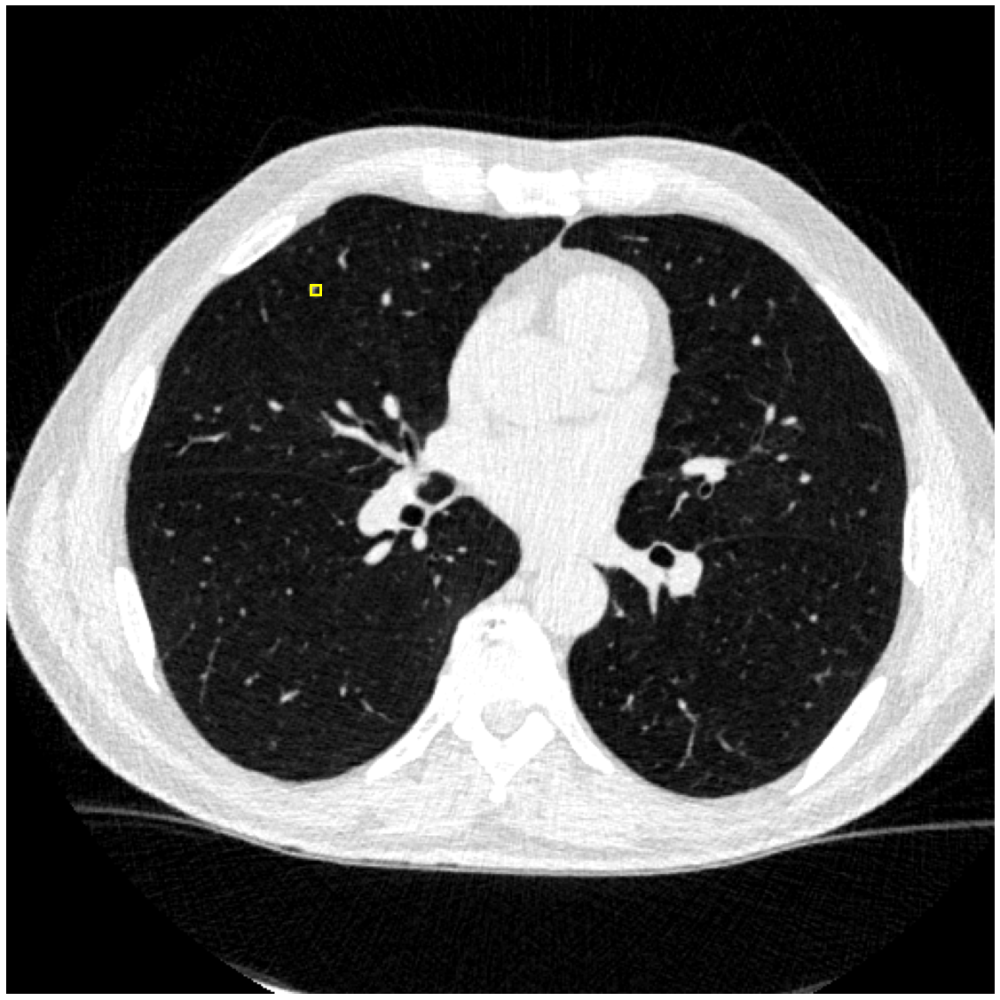

|------------------------------ No=2 ------------------------------|


Loading the Image:DLCS_1417.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1417_01
WorlCoord  CCC (x,y,x) =[-102.19810486   62.00637817  -97.01312256]
VoxelCoord CCC (x,y,y) =(133, 195, 342)
WorldCoord (w,h,d) =[5.625      5.71289062 5.78125   ]
VoxelCoord (w,h,d) =[7, 7, 9]


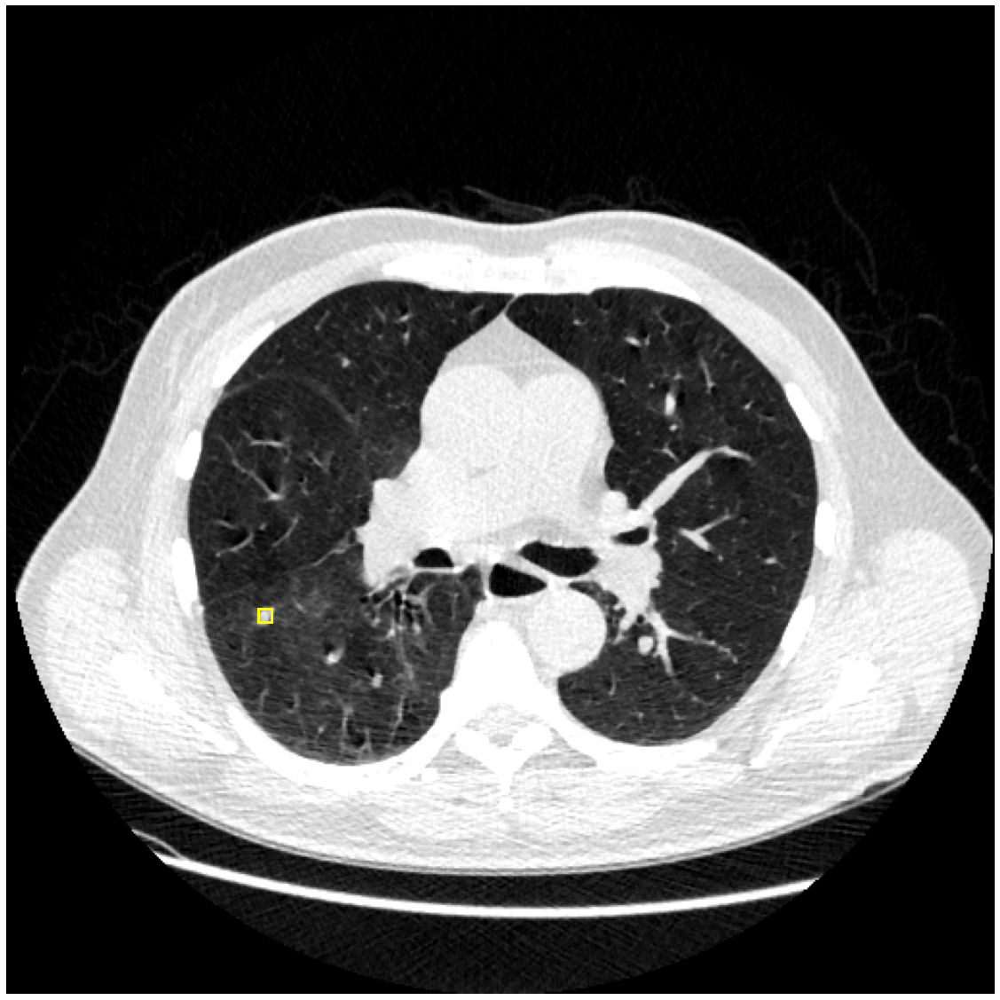

|------------------------------ No=3 ------------------------------|


Loading the Image:DLCS_1418.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_01
WorlCoord  CCC (x,y,x) =[ -58.35742188 -149.03027344  -64.33123779]
VoxelCoord CCC (x,y,y) =(177, 213, 417)
WorldCoord (w,h,d) =[6.85546875 6.76757812 6.875     ]
VoxelCoord (w,h,d) =[8, 8, 11]


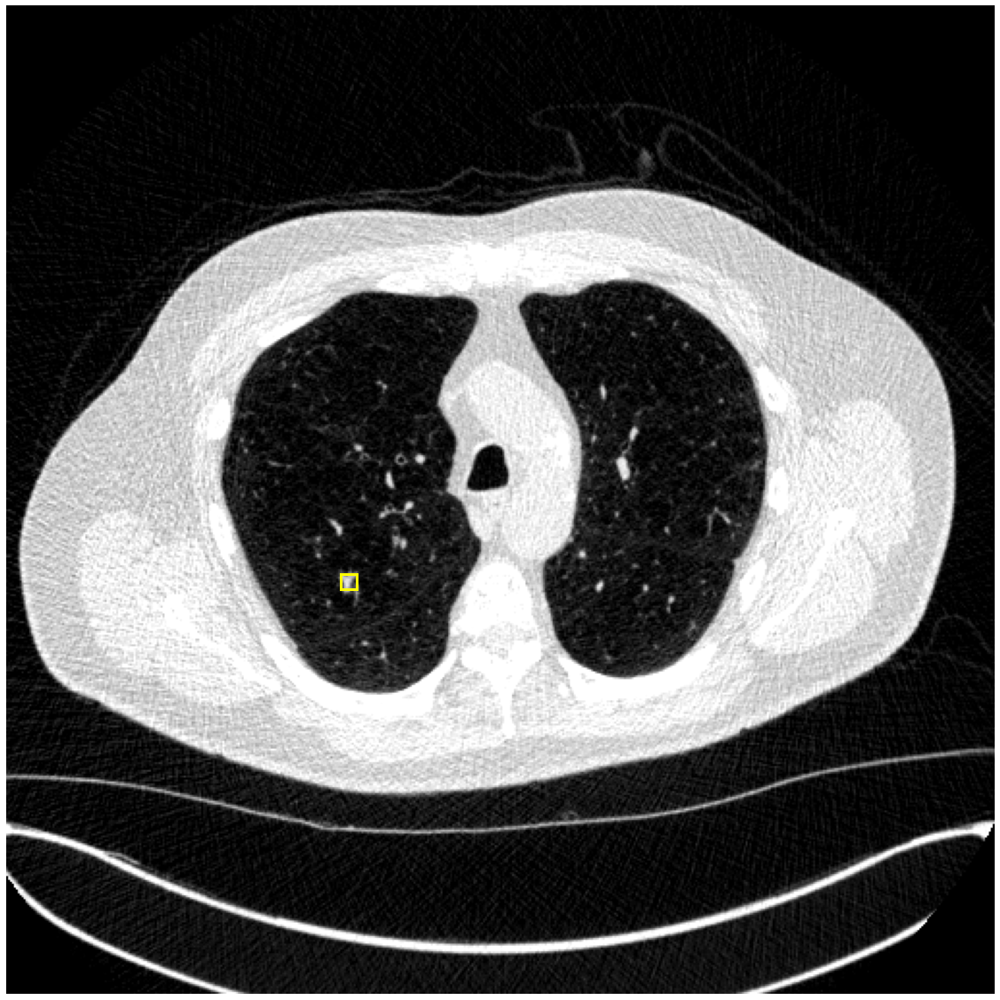

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_02
WorlCoord  CCC (x,y,x) =[ -72.24414062 -114.92871094 -116.83123779]
VoxelCoord CCC (x,y,y) =(160, 172, 330)
WorldCoord (w,h,d) =[3.69140625 3.77929688 3.4375    ]
VoxelCoord (w,h,d) =[4, 4, 5]


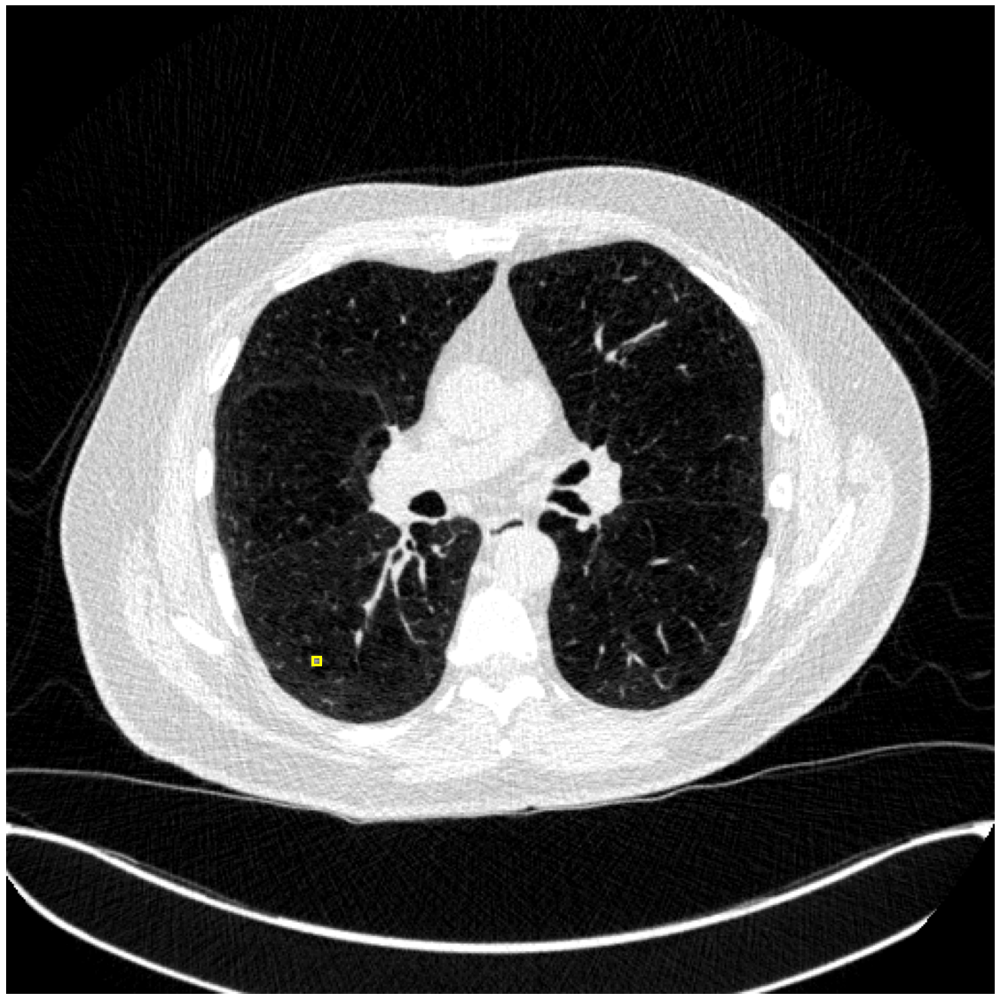

|------------------------------ No=4 ------------------------------|


Loading the Image:DLCS_1419.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_01
WorlCoord  CCC (x,y,x) =[ 82.52929688  37.83691406 -75.546875  ]
VoxelCoord CCC (x,y,y) =(373, 201, 423)
WorldCoord (w,h,d) =[4.21875    4.13085938 3.90625   ]
VoxelCoord (w,h,d) =[6, 5, 6]


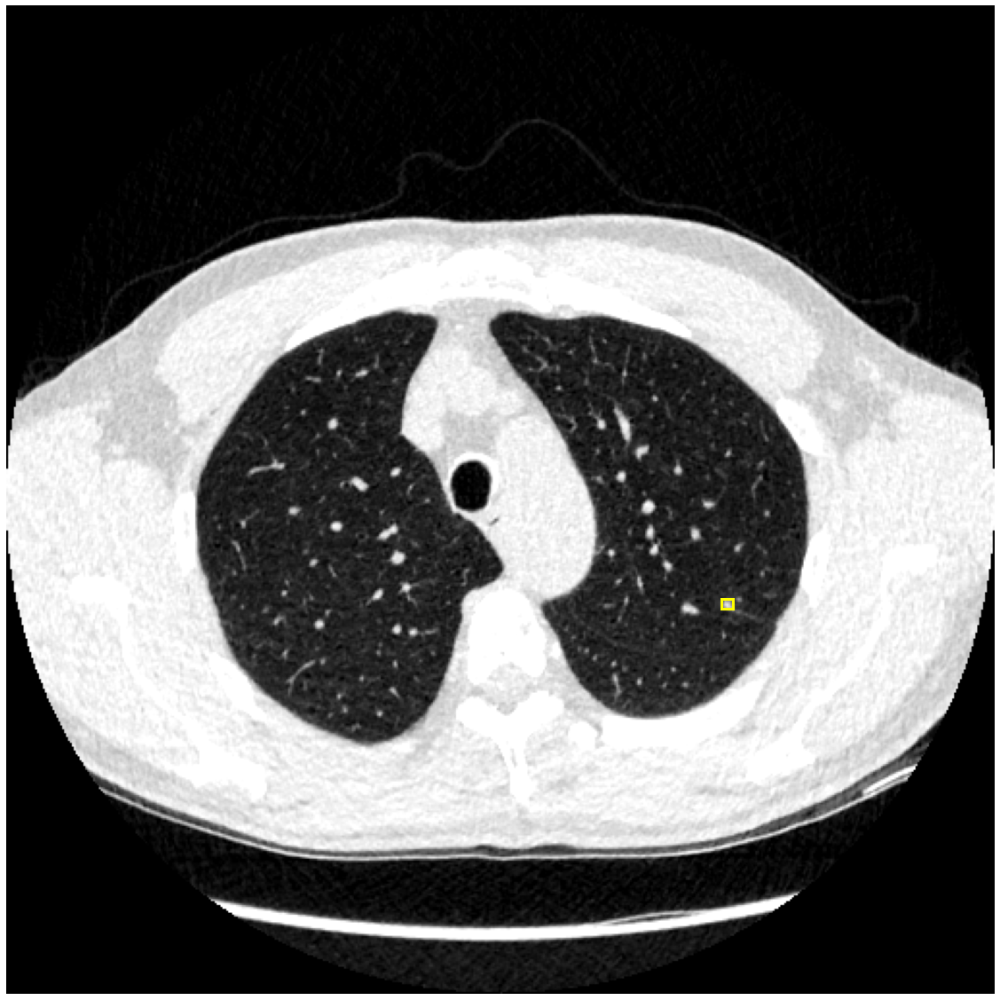

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_02
WorlCoord  CCC (x,y,x) =[-120.49804688    9.36035156 -163.359375  ]
VoxelCoord CCC (x,y,y) =(85, 242, 283)
WorldCoord (w,h,d) =[6.50390625 6.41601562 6.40625   ]
VoxelCoord (w,h,d) =[9, 9, 10]


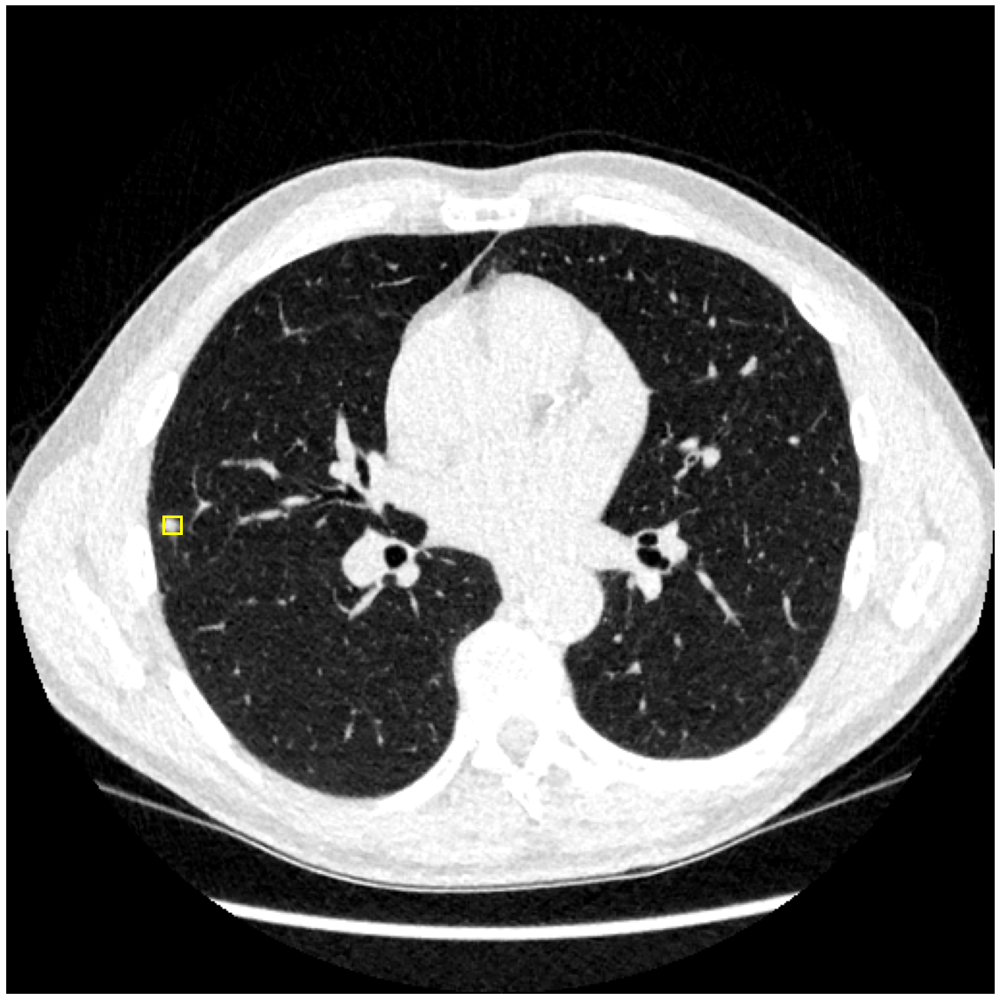

|------------------------------ No=5 ------------------------------|


Loading the Image:DLCS_1420.nii.gz
Number of Annotation:3
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_01
WorlCoord  CCC (x,y,x) =[ -70.75195312   62.53417969 -217.5390625 ]
VoxelCoord CCC (x,y,y) =(155, 166, 212)
WorldCoord (w,h,d) =[10.01953125 10.10742188  9.921875  ]
VoxelCoord (w,h,d) =[14, 14, 15]


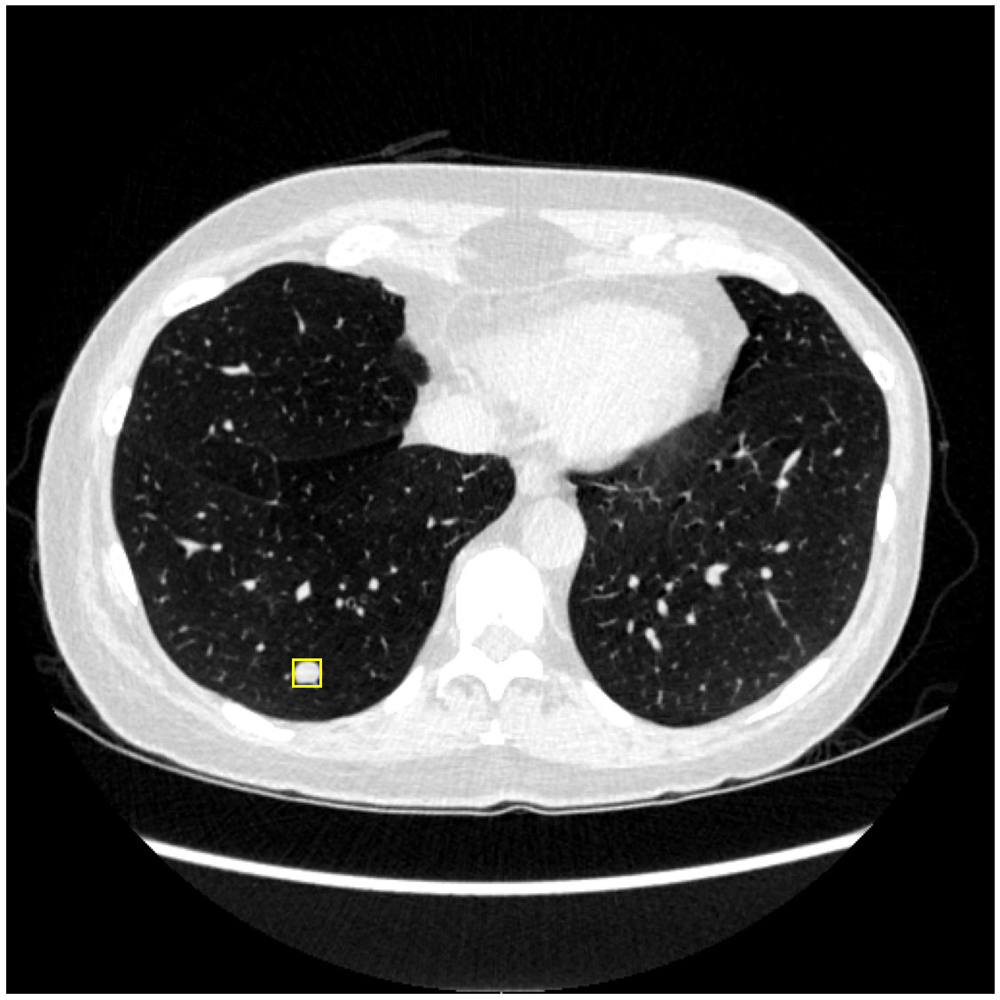

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_02
WorlCoord  CCC (x,y,x) =[ -97.20703125  -38.84765625 -100.390625  ]
VoxelCoord CCC (x,y,y) =(118, 310, 399)
WorldCoord (w,h,d) =[4.21875 4.21875 3.90625]
VoxelCoord (w,h,d) =[6, 6, 6]


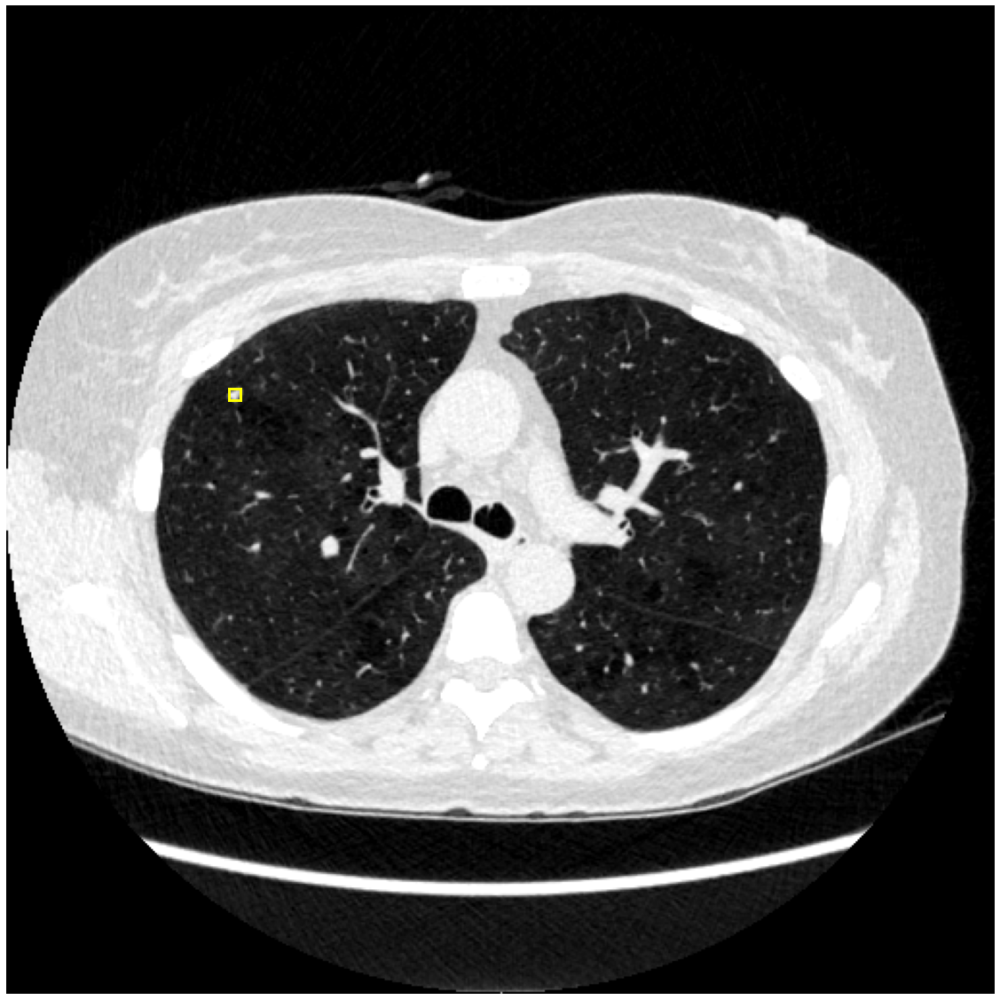

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_03
WorlCoord  CCC (x,y,x) =[  71.49902344  -62.578125   -109.765625  ]
VoxelCoord CCC (x,y,y) =(358, 344, 384)
WorldCoord (w,h,d) =[4.13085938 4.21875    3.90625   ]
VoxelCoord (w,h,d) =[5, 6, 6]


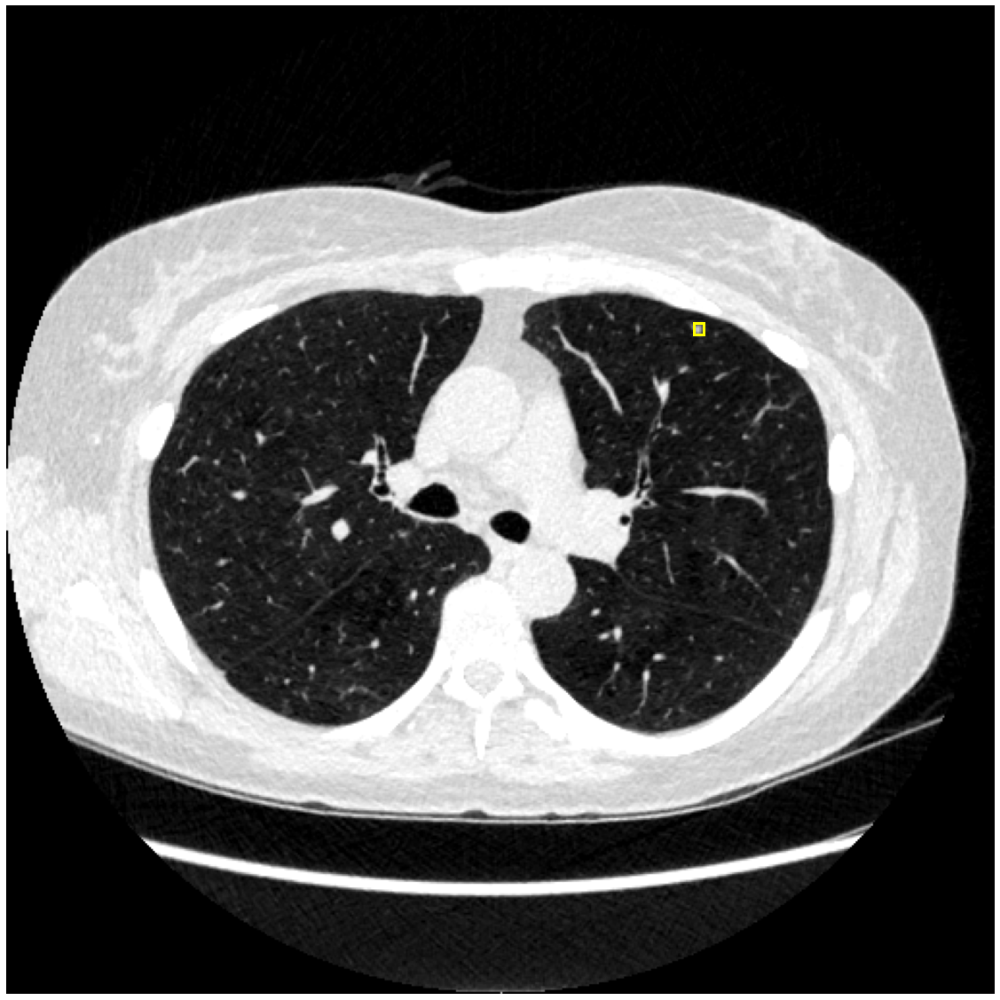

In [1]:
import cv2
import numpy as np
import SimpleITK as sitk
import numpy as np
import csv
import os
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import math 
import pandas as pd

def make_bold(text):
    return f"\033[1m{text}\033[0m"



#-| this function load an image using simpleITK and return 
#-|3D array, origin_numpy and spacing numpy
def load_itk_image(filename):
    '''
    this function load an image using simpleITK and return
    3D array, origin_numpy and spacing numpy
    input:  filename     = nifty CT image path eg."./CT_CTGRAV_TMP404180_4.nii.gz"
    output: numpyImage   = 3D CT numpy as slice X height x Width (z,y,x)
            numpyOrigin  = (z_origin,  y_origin,  x_origin)
            numpySpacing = (z_Spacing, y_Spacing, x_Spacing)
    '''
    itkimage = sitk.ReadImage(filename)           # load the ct image
    numpyImage = sitk.GetArrayFromImage(itkimage) # give CT to 3D numpy (z,y,x)
   
    #- When we load get the  itkimage.GetOrigin/GetSpacing it 
    # returns the array in order (x_origin, y_origin,z_origin)
    # as we loaded the CT image as 3D numpy (z,y,x) that is why
    # we also reversed the acquired spacing and origin
    numpyOrigin  = itkimage.GetOrigin()   # 3D numpy (x_origin,  y_origin,  z_origin)
    numpySpacing = itkimage.GetSpacing() # 3D numpy (z_Spacing, y_Spacing, x_Spacing)
    return numpyImage, numpyOrigin, numpySpacing





#-- Normalizing image for better visualization

def normalize_image_to_uint8(image, lower_bound=-1000, upper_bound=100):
    """
    Clip the image to the lung window, then normalize it to uint8.
    Args:
        image: numpy array
        lower_bound: lower HU bound for the lung window (default: -1500 HU)
        upper_bound: upper HU bound for the lung window (default: -500 HU)
    """
    # Clip to lung window
    clipped_img = np.clip(image, lower_bound, upper_bound)
    
    # Normalize to [0, 255]
    normalized_img = ((clipped_img - lower_bound) / (upper_bound - lower_bound)) * 255.0
    normalized_img = normalized_img.astype(np.uint8)
    return normalized_img





raw_data_path = '/NAS/shared_data/for_VNLST/ft42/DukeLungRads_Dir/DLCS24/'
dataset_csv   = '/NAS/shared_data/for_VNLST/ft42/DukeLungRads_Dir/Zenodo_metadata/DLCSD24_Annotations.csv'
df             = pd.read_csv(dataset_csv)



# returns JSON object as 
# a dictionary
Final_dect = df[(df['benchmark_split']=='test')]['ct_nifti_file'].unique()




for dictonary_list_i in range(0,5):#len(Final_dect)):
    #print('|------------------------ No={} ---------------------|'.format(dictonary_list_i))
    print(make_bold('|' + '-'*30 + ' No={} '.format(dictonary_list_i+1) + '-'*30 + '|'))
    print('\n')
    
    desired_value      = Final_dect[dictonary_list_i]        # Replace with the value you want
    filtered_df        = df[df['ct_nifti_file'] == desired_value]
    example_dictionary = filtered_df.reset_index()
   

    # load image
    print('Loading the Image:{}'.format(example_dictionary['ct_nifti_file'][0]))
    print('Number of Annotation:{}'.format(len(example_dictionary)))
    ct_nifti_path = raw_data_path+example_dictionary['ct_nifti_file'][0]
    sitk_img      = sitk.ReadImage(ct_nifti_path)
    sitk_numpy    = sitk.GetArrayFromImage(sitk_img)



    for Which_box_to_use in range(0,len(example_dictionary)):
        print('-----------------------------------------------------------------------------------------------')
        print('Annotation-ID ={}'.format(example_dictionary["nodule_id"][Which_box_to_use]))
        worldCoord = np.asarray([float(example_dictionary["coordX"][Which_box_to_use]),float(example_dictionary["coordY"][Which_box_to_use]),float(example_dictionary["coordZ"][Which_box_to_use])])
        voxelCoord = sitk_img.TransformPhysicalPointToIndex(worldCoord)
        print('WorlCoord  CCC (x,y,x) ={}'.format(worldCoord))
        print('VoxelCoord CCC (x,y,y) ={}'.format(voxelCoord))

        whd_worldCoord  = np.asarray([float(example_dictionary["w"][Which_box_to_use]),float(example_dictionary["h"][Which_box_to_use]),float(example_dictionary["d"][Which_box_to_use])])
        spacing         = sitk_img.GetSpacing()
        w               = int(whd_worldCoord[0] / spacing[0])
        h               = int(whd_worldCoord[1] / spacing[1])
        d               = int(whd_worldCoord[2] / spacing[2])
        whd_voxelCoord  = [w,h,d]
        print('WorldCoord (w,h,d) ={}'.format(whd_worldCoord))
        print('VoxelCoord (w,h,d) ={}'.format(whd_voxelCoord))

        
        plt.figure(figsize=(16,16))
        ct_numpy_imag = normalize_image_to_uint8(sitk_numpy[voxelCoord[2],:,:], lower_bound=-1000, upper_bound=100)
        plt.imshow(ct_numpy_imag,cmap='gray',origin='lower')    
        plt.tight_layout()        
        plt.axis('off')
        
        
        start_x  = int(voxelCoord[0] - int(w//2))
        start_y  = int(voxelCoord[1] - int(h//2))
        
        rect = plt.Rectangle((start_x, start_y), w, h, fill=False, color='yellow', linewidth=3)
        plt.gca().add_patch(rect)
        plt.show()


# Visualize in 3 views 

|------------------------------ No=1 ------------------------------|


Loading the Image:DLCS_1416.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1416_01
WorlCoord  CCC (x,y,x) =[ -85.19238281 -267.62988281 -275.73126221]
VoxelCoord CCC (x,y,y) =(159, 364, 280)
WorldCoord (w,h,d) =[4.04296875 4.04296875 4.0625    ]
VoxelCoord (w,h,d) =[5, 5, 6]


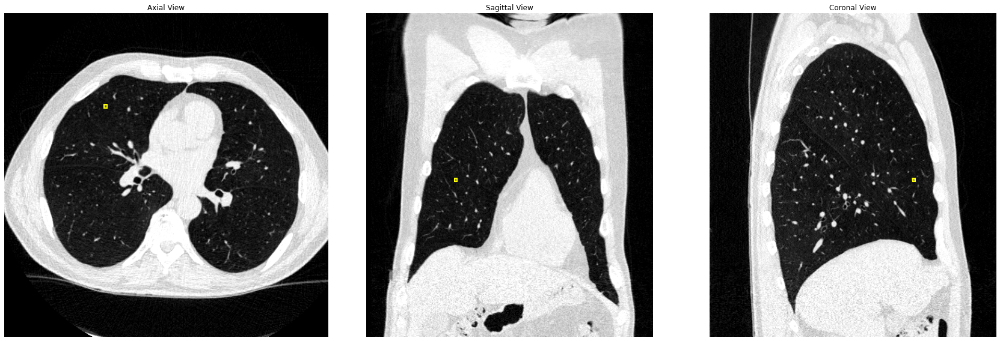

|------------------------------ No=2 ------------------------------|


Loading the Image:DLCS_1417.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1417_01
WorlCoord  CCC (x,y,x) =[-102.19810486   62.00637817  -97.01312256]
VoxelCoord CCC (x,y,y) =(133, 195, 342)
WorldCoord (w,h,d) =[5.625      5.71289062 5.78125   ]
VoxelCoord (w,h,d) =[7, 7, 9]


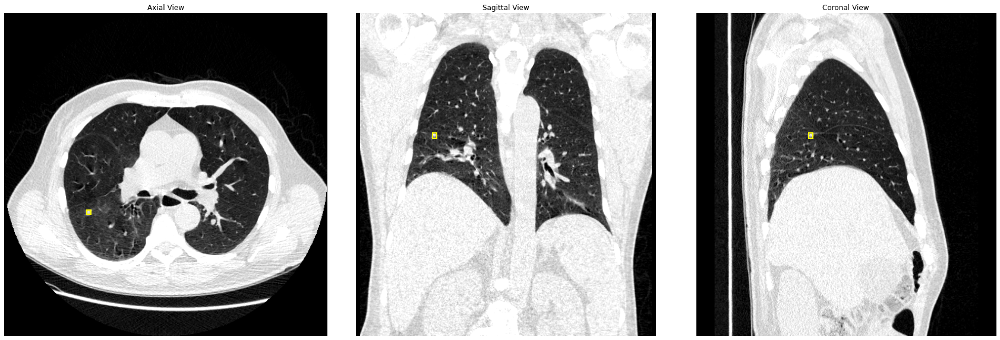

|------------------------------ No=3 ------------------------------|


Loading the Image:DLCS_1418.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_01
WorlCoord  CCC (x,y,x) =[ -58.35742188 -149.03027344  -64.33123779]
VoxelCoord CCC (x,y,y) =(177, 213, 417)
WorldCoord (w,h,d) =[6.85546875 6.76757812 6.875     ]
VoxelCoord (w,h,d) =[8, 8, 11]


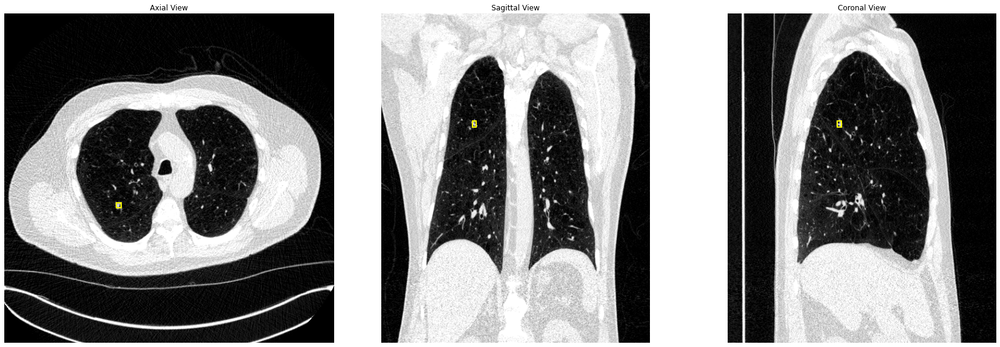

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_02
WorlCoord  CCC (x,y,x) =[ -72.24414062 -114.92871094 -116.83123779]
VoxelCoord CCC (x,y,y) =(160, 172, 330)
WorldCoord (w,h,d) =[3.69140625 3.77929688 3.4375    ]
VoxelCoord (w,h,d) =[4, 4, 5]


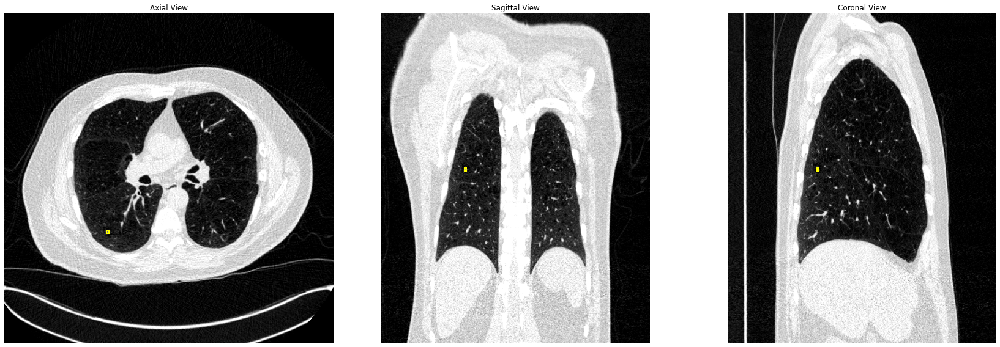

|------------------------------ No=4 ------------------------------|


Loading the Image:DLCS_1419.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_01
WorlCoord  CCC (x,y,x) =[ 82.52929688  37.83691406 -75.546875  ]
VoxelCoord CCC (x,y,y) =(373, 201, 423)
WorldCoord (w,h,d) =[4.21875    4.13085938 3.90625   ]
VoxelCoord (w,h,d) =[6, 5, 6]


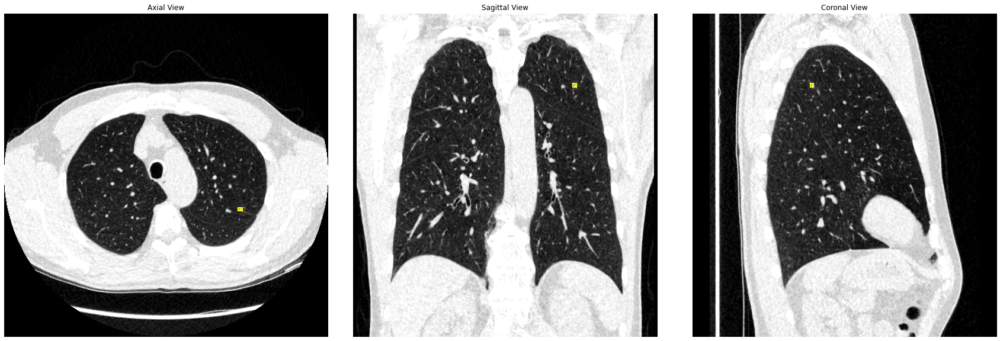

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_02
WorlCoord  CCC (x,y,x) =[-120.49804688    9.36035156 -163.359375  ]
VoxelCoord CCC (x,y,y) =(85, 242, 283)
WorldCoord (w,h,d) =[6.50390625 6.41601562 6.40625   ]
VoxelCoord (w,h,d) =[9, 9, 10]


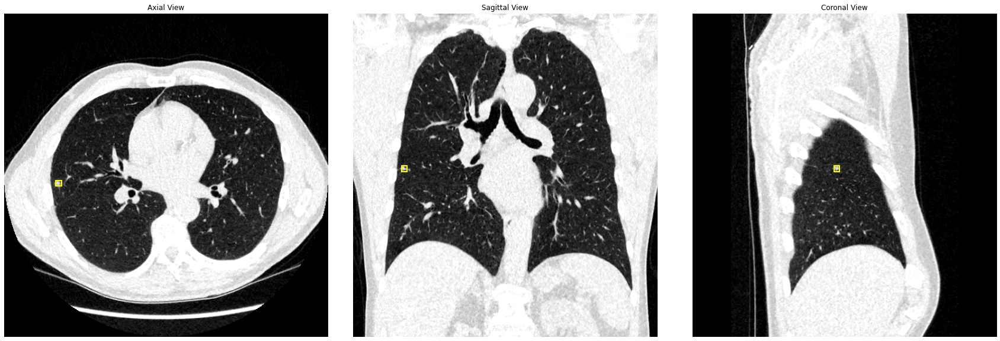

|------------------------------ No=5 ------------------------------|


Loading the Image:DLCS_1420.nii.gz
Number of Annotation:3
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_01
WorlCoord  CCC (x,y,x) =[ -70.75195312   62.53417969 -217.5390625 ]
VoxelCoord CCC (x,y,y) =(155, 166, 212)
WorldCoord (w,h,d) =[10.01953125 10.10742188  9.921875  ]
VoxelCoord (w,h,d) =[14, 14, 15]


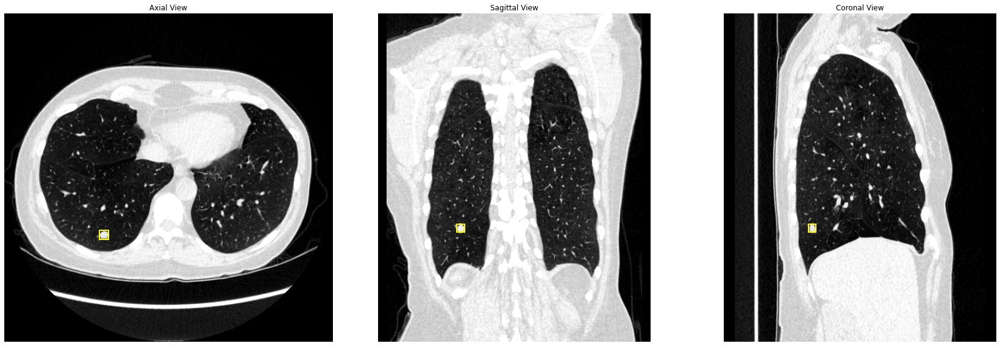

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_02
WorlCoord  CCC (x,y,x) =[ -97.20703125  -38.84765625 -100.390625  ]
VoxelCoord CCC (x,y,y) =(118, 310, 399)
WorldCoord (w,h,d) =[4.21875 4.21875 3.90625]
VoxelCoord (w,h,d) =[6, 6, 6]


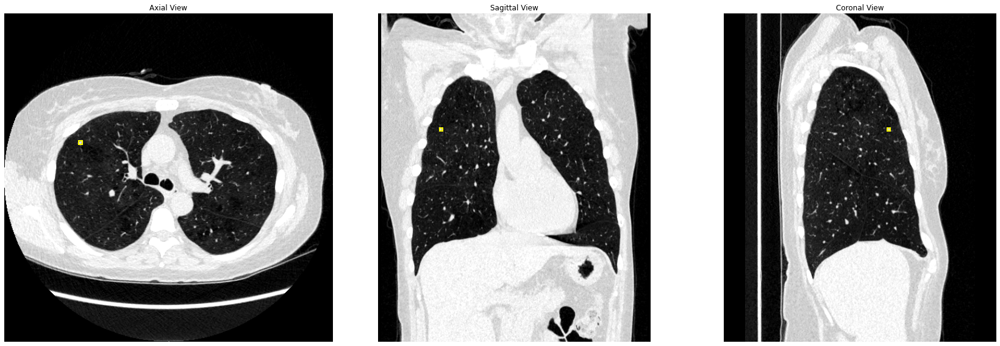

-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_03
WorlCoord  CCC (x,y,x) =[  71.49902344  -62.578125   -109.765625  ]
VoxelCoord CCC (x,y,y) =(358, 344, 384)
WorldCoord (w,h,d) =[4.13085938 4.21875    3.90625   ]
VoxelCoord (w,h,d) =[5, 6, 6]


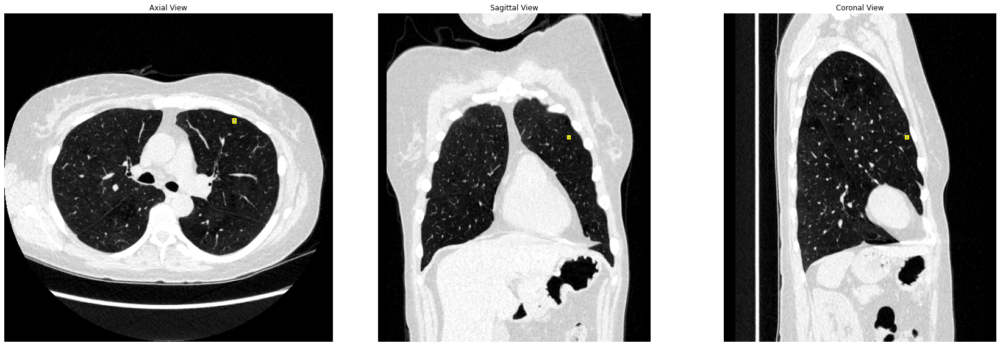

In [2]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
import pandas as pd


def make_bold(text):
    return f"\033[1m{text}\033[0m"
    
def normalize_image_to_uint8(image, lower_bound=-1000, upper_bound=100):
    clipped_img = np.clip(image, lower_bound, upper_bound)
    normalized_img = ((clipped_img - lower_bound) / (upper_bound - lower_bound)) * 255.0
    normalized_img = normalized_img.astype(np.uint8)
    return normalized_img

# Load DataFrame and data as before

raw_data_path = '/NAS/shared_data/for_VNLST/ft42/DukeLungRads_Dir/DLCS24/'
dataset_csv   = '/NAS/user_data/user/ft42/LungRADS_Modeling/DLCSD24_Annotations.csv'
  
df = pd.read_csv(dataset_csv)
final_dict = df[df['benchmark_split'] == 'test']['ct_nifti_file'].unique()

# Loop to process each unique CT file
for idx in range(0,5):#len(final_dict)):
    # Processing each image
    ct_path = raw_data_path + final_dict[idx]
    ct_image = sitk.ReadImage(ct_path)
    ct_array = sitk.GetArrayFromImage(ct_image)
    filtered_df = df[df['ct_nifti_file'] == final_dict[idx]].reset_index()

    #print('|------------------------ No={} ---------------------|'.format(dictonary_list_i))
    print(make_bold('|' + '-'*30 + ' No={} '.format(idx+1) + '-'*30 + '|'))
    print('\n')
    print('Loading the Image:{}'.format(filtered_df['ct_nifti_file'][0]))
    print('Number of Annotation:{}'.format(len(filtered_df)))
    
    for j, row in filtered_df.iterrows():
        print('-----------------------------------------------------------------------------------------------')
        print('Annotation-ID ={}'.format(row["nodule_id"]))
        world_coords = np.asarray([float(row["coordX"]), float(row["coordY"]), float(row["coordZ"])])
        voxel_coords = ct_image.TransformPhysicalPointToIndex(world_coords)
        print('WorlCoord  CCC (x,y,x) ={}'.format(world_coords))
        print('VoxelCoord CCC (x,y,y) ={}'.format(voxel_coords))
        
        # Calculate bounding box dimensions
        whd_worldCoord  = np.asarray([float(row["w"]),float(row["h"]),float(row["d"])])
        spacing = ct_image.GetSpacing()
        w = int(float(row["w"]) / spacing[0])
        h = int(float(row["h"]) / spacing[1])
        d = int(float(row["d"]) / spacing[2])
        whd_voxelCoord  = [w,h,d]

        print('WorldCoord (w,h,d) ={}'.format(whd_worldCoord))
        print('VoxelCoord (w,h,d) ={}'.format(whd_voxelCoord))
        
        # Create subplots
        fig, axes = plt.subplots(1, 3, figsize=(24, 8))
        
        # Axial view
        ax = axes[0]
        axial_image = normalize_image_to_uint8(ct_array[voxel_coords[2], :, :], -1000, 100)
        ax.imshow(axial_image, cmap='gray',origin='lower')
        rect = plt.Rectangle((voxel_coords[0] - w//2, voxel_coords[1] - h//2), w, h, edgecolor='yellow', linewidth=2, fill=False)
        ax.add_patch(rect)
        ax.set_title('Axial View')
        ax.axis('off')

        # Sagittal view
        ax = axes[1]
        sagittal_image = normalize_image_to_uint8(ct_array[:, voxel_coords[1], :], -1000, 100)
        ax.imshow(sagittal_image, cmap='gray',origin='lower')
        rect = plt.Rectangle((voxel_coords[0] - w//2, voxel_coords[2] - d//2), w, d, edgecolor='yellow', linewidth=2, fill=False)
        ax.add_patch(rect)
        ax.set_title('Sagittal View')
        ax.axis('off')

        # Coronal view
        ax = axes[2]
        coronal_image = normalize_image_to_uint8(ct_array[:, :, voxel_coords[0]], -1000, 100)
        ax.imshow(coronal_image, cmap='gray',origin='lower')
        rect = plt.Rectangle((voxel_coords[1] - h//2, voxel_coords[2] - d//2), h, d, edgecolor='yellow', linewidth=2, fill=False)
        ax.add_patch(rect)
        ax.set_title('Coronal View')
        ax.axis('off')
        
        plt.tight_layout()
        plt.show()
